# VinBigData Chest X-ray Abnormalities Detection

## Data Visualisation

**Author: Théo LANGÉ** - s394369 - theo.lange.369@cranfield.ac.uk

This notebook presents the competition and its objective. In addition, data analysis and visualisation is performed using both the input dataset given for the competition and the dataset obtained through preprocessing using the notebook `AI_VinBigData_Data_Preprocessing`. One could also access the resulting data directly on kaggle: 
> https://www.kaggle.com/datasets/theolange/ai-vinbigdata

In addition, the interactive outputs are not visible on this notebook unfortunately. They are available directly on kaggle if needed:
> https://www.kaggle.com/code/theolange/ai-vinbigdata-visualisation

<br>

As explained in the [competition overview](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/overview), the goal of the competition is to localise and classify 14 different types of chest abnormalities on chest radiograph images. In order to do so, we are given a set of 15,000 labelled images as a **training set**. These images have been randomly picked within a larger set of chest x-ray images as described in the [paper](https://arxiv.org/pdf/2012.15029.pdf). Each image has been labelled by 3 different radiologists in a blind fashion. The **test data** is composed of 3,000 images that were labelled based on a consensus of 5 different radiologists. 

Our goal is to classify common thoracic lung diseases and to localise the chest abnormalities.
<br>**This is an object detection and classification problem**.

## Table of contents
0. [Dataset information](#0)
1. [Labelling process of the images](#1)
2. [Imports and Setup](#2)
3. [Data Visualisation and Analysis](#3)
    <br>3.1. [Tabular Data](#4)</br>
    3.2. [The Images](#5)

<a id="0"></a>
# 0. Dataset information
___

The dataset comprises 18,000 chest xray radiographs images in the DICOM format. In this competition 15,000 radiographs images will be used as the training set and 3,000 for the testing set.
<br> The 15,000 training images have been labelled by 3 radiographs amongst 14 different radiographs for the presence of 14 different possible abnormalities: 

> **`0`** - Aortic enlargement <br>
>**`1`** - Atelectasis <br>
>**`2`** - Calcification <br>
>**`3`** - Cardiomegaly <br>
>**`4`** - Consolidation <br>
>**`5`** - ILD <br>
>**`6`** - Infiltration <br>
>**`7`** - Lung Opacity <br>
>**`8`** - Nodule/Mass <br>
>**`9`** - Other lesion <br>
>**`10`** - Pleural effusion <br>
>**`11`** - Pleural thickening <br>
>**`12`** - Pneumothorax <br>
>**`13`** - Pulmonary fibrosis <br>
>**`14`** - "No finding" observation was intended to capture the absence of all findings above

<br>

The second part of the dataset is the file **`train.csv`**. This file contain the metadata of the train set with each row for one specific abnormalities detected on a specific image and the localisation of the abnormalities on this image. This file contain the following columns: 

> **`image_id`** - unique image identifier<br>
>**`class_name`** - the name of the class of detected object (or "No finding")<br>
>**`class_id`** - the ID of the class of detected object<br>
>**`rad_id`** - the ID of the radiologist that made the observation<br>
>**`x_min`** - minimum X coordinate of the object's bounding box<br>
>**`y_min`** - minimum Y coordinate of the object's bounding box<br>
>**`x_max`** - maximum X coordinate of the object's bounding box<br>
>**`y_max`** - maximum Y coordinate of the object's bounding box

So, a key part of the project is to first analyse the data and the information available in order to devise the best model for the localisation and the prediction of the 14 different types of chest abnormalities on chest radiograph images.

In addition, these initial datas have been processing and transformed to form the dataset that is used for the prediction: [AI-VinBigData](https://www.kaggle.com/datasets/theolange/ai-vinbigdata). This dataset have been obtained using the notebook `AI_VinBigData_preprocessing`.

First, let's take a look at the method used to label the images

<a id="1"></a>
# 1. Labelling process of the images
___

Understanding how the datas have been created is often important when it comes to the modeling decisions. [The paper](https://arxiv.org/pdf/2012.15029.pdf) described in detail how the datas have been obtained and labelled. Figure 1 of this document shows how the different images have been labelled by radiologists:

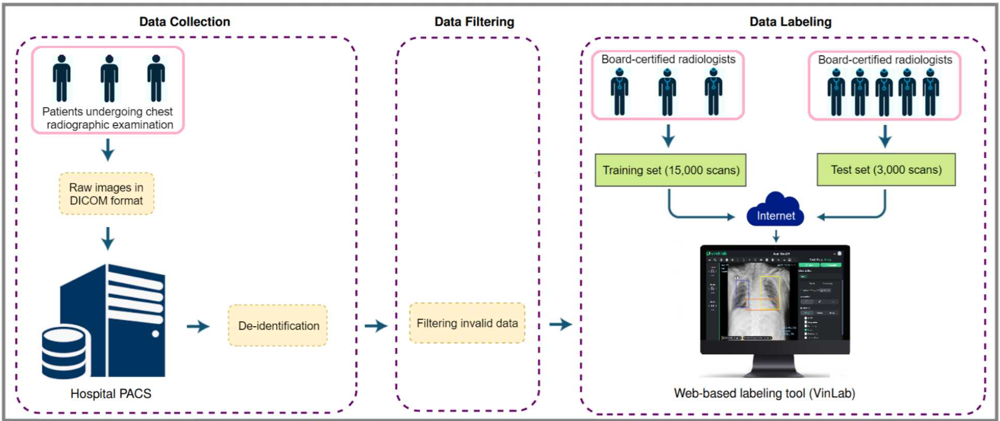

Given the explanations, one can note that the labelling process used to label the test set is different from the one used for the training datas: 
> For the test set, 5 radiologists involved into a two-stage labeling process. During the first stage, each image was independently annotated by 3 radiologists. In the second stage, 2 other radiologists, who have a higher level of experience, reviewed the annotations of the 3 previous annotators and communicated with each other in order to decide the final labels. The disagreements among initial annotators were carefully discussed and resolved by the 2 reviewers. Finally, the consensus of their opinions will serve as reference ground-truth.

Our goal is then to predict this consensus on the test set given the train set for which the consensus stage has not been done.

<a id="2"></a>
# 2. Imports and Setup

___

In [1]:
pip install ensemble_boxes

Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import sys
import shutil
from glob import glob

import numpy as np
import pandas as pd
import cv2
from tqdm.notebook import tqdm

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from ensemble_boxes import *

LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in sns.color_palette("Spectral", 15)]

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Define the root data directory
OG_DATA_DIR = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection"

# Define the paths to the training and testing dicom folders respectively
OG_TRAIN_DIR = os.path.join(OG_DATA_DIR, "train")
OG_TEST_DIR = os.path.join(OG_DATA_DIR, "test")
OG_LABELS_DIR = os.path.join(OG_DATA_DIR, "labels")

# Define paths to the relevant csv files
OG_TRAIN_CSV = os.path.join(OG_DATA_DIR, "train.csv")

# Define the root data directory
DATA_DIR = "/kaggle/input/ai-vinbigdata"

# Define the paths to the training and testing dicom folders respectively
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")
LABELS_DIR = os.path.join(DATA_DIR, "labels")

# Define paths to the relevant csv files
TRAIN_CSV = os.path.join(DATA_DIR, "train.csv")

# Working directory
WORKING_DIR = "/kaggle/working"

<a id="3"></a>
# 3. Data Visualisation and Analysis

<a id="4"></a>
## 3.1. Tabular Data

The `train.csv` file gives the outcomes of the labelling of each image in the train set (characterised by their unique ID `image_id`) by 3 different radiologist (characterised by their unique ID `rad_id`). Each row of the file corresponds to a specific class (`class_name` and `class_id`) for an image. 

In the case where a finding is labelled on an image, there is a bounding box given characterised by a rectangle given by its minimum x (`x_min`), maximum x (`x_max`), minimum y (`y_min`) and maximum y (`y_max`) coordinates. As one can see on the table displayed, in the case of *No Finding*, the coordinates are `NaN` values

In [4]:
train_df = pd.read_csv(OG_TRAIN_CSV)
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN


In [5]:
# Utils function 

int_2_str = {i:train_df[train_df["class_id"]==i].iloc[0]["class_name"] for i in range(15)}
str_2_int = {v:k for k,v in int_2_str.items()}
int_2_clr = {str_2_int[k]:LABEL_COLORS[i] for i,k in enumerate(sorted(str_2_int.keys()))}

### 3.1.1. IMAGE_ID Column Exploration

At first, we can look at the number of annotations per images as well as the number of unique abnormalities per images

In [6]:
"""
Plot the distribution of annotations per images

Input: Train DataFrame
Output: None, a histogram will be displayed
"""

def plot_annotation_per_img_distribution(train_df):
    
    fig = px.histogram(train_df.image_id.value_counts(), 
                       log_y=True, color_discrete_sequence=['indianred'], opacity=0.7,
                       labels={"value":"Number of Annotations Per Image"},
                       title="<b>DISTRIBUTION OF THE NUMBER OF ANNOTATIONS PER PATIENT   " \
                             "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                       )

    fig.update_layout(showlegend=False,
                      xaxis_title="<b>Number of Annotation on an image</b>",
                      yaxis_title="<b>Image Count</b>",)
    fig.show()

In [7]:
# Plot the distribution of total annotation per images
plot_annotation_per_img_distribution(train_df)

In [8]:
"""
Plot the distribution of unique abnormality annotations per images

Input: Train DataFrame
Output: None, a histogram will be displayed
"""

def plot_unique_annotation_per_img_distribution(train_df):
    
    fig = px.histogram(train_df.groupby('image_id')["class_name"].unique().apply(lambda x: len(x)), 
                 log_y=True, color_discrete_sequence=['skyblue'], opacity=0.7,
                 labels={"value":"Number of Unique Abnormalities"},
                 title="<b>DISTRIBUTION OF THE NUMBER OF ANNOTATIONS PER PATIENT   " \
                       "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                       )
    
    fig.update_layout(showlegend=False,
                      xaxis_title="<b>Number of Unique Abnormalities</b>",
                      yaxis_title="<b>Count of Unique Images</b>",)
    fig.show()

In [9]:
# Plot the distribution of unique annotation per images
plot_unique_annotation_per_img_distribution(train_df)

One can see that the vast majority of the train images presents only 3 annotations. This case correspond in majority to images that were labelled as `No finding`. In addition, when looking at those two figures, we remark that many images presents more annotations that the mean number of unique annotations. This is a result of several annotations for the same label, often located in the same region of the images. This is an observation that motivated the use of Boxes Fusion algorithm in order to fuse boxes that shared the same label and were located in the same region.

### 3.1.2. CLASS Column Exploration

As explained in the [competition description](https://www.kaggle.com/competitions/vinbigdata-chest-xray-abnormalities-detection/overview), the data is composed of 15 classes describing abnormalities or no finding with the parameter `class_id` ranging from 0 to 14.

In [10]:
"""
This function returns the distribution of Abnormalities in the train dataset as well as the class

Input: Train DataFrame
Output: A pd Series with the distribution of abnormalities and the list of class
"""


def get_abnormalities_distribution(train_df):
    
    abnormalities_distribution = np.zeros(15)

    # Get the list of class
    class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
    class_list = list(np.array(class_names)[np.argsort(class_ids)])
    class_list = list(map(lambda x: str(x), class_list))

    val = train_df[['image_id', 'class_id']].values
    
    # Get all the unique abnormalities annotated on each images
    for file in os.listdir(TRAIN_DIR): 
        index = np.where(val[:,0] == file[:-5])[0]

        abn_list = np.unique(val[index,1])

        for abn in abn_list:
            abnormalities_distribution[abn] += 1

    # Get the abnormalities distribution
    abnormalities_distribution, class_list = zip(*sorted(zip(abnormalities_distribution, class_list)))
    
    temp = pd.Series(np.array(abnormalities_distribution).astype(np.int64), index = class_list)
    
    return temp, class_list

In [11]:
# Get the distribution of abnormalities
abnormalities_distribution, class_list = get_abnormalities_distribution(train_df)

In [12]:
"""
Plot the distribution of Abnormalities in the train dataset

Input: A pd.Series of abnormalities annotation count
Output: None, the distribution will be displayed on a histogram
"""

def plot_abnormality_distribution(abnormalities_distribution):

    fig = px.bar(abnormalities_distribution, 
                 color=abnormalities_distribution.index, opacity=0.85,
                 color_discrete_sequence=LABEL_COLORS, log_y=True,
                 labels={"y":"Unique Annotations Per Class", "x":""},
                 title="<b>Unique Annotations Per Class</b>",)
    
    fig.update_layout(legend_title=None,
                      xaxis_title="",
                      yaxis_title="<b>Number of Positive images</b>")

    fig.show()

In [13]:
# Plot the distribution of abnormality
plot_abnormality_distribution(abnormalities_distribution)

This figure present the number of image being positive to a specific abnormality. Again, we can see that the majority of the images doesn't have any annotations as they are labelled as `No Finding`. This might cause trouble during the training as the majority of images will account as `No Finding` and the trained models might predict more `No Finding` images than there actually are.

That's why the method developped for this competition will be divided into two main parts: 
> A first part that will only look at abnormal images in order to distinguish abnormalities
> A second part that will look at all the images in order to classify them as Normal or Abnormal

In addition, a description of each categories is available in [the paper](https://arxiv.org/pdf/2012.15029.pdf) describing the datasets: 

0. **Aortic enlargement**: "An abnormal bulge that occurs in the wall of the major blood vessel."
1. **Atelectasis**: "Collapse of a part of the lung due to a decrease in the amount of air in the alveoli resulting in volume loss and increased density." 
2. **Calcification**: "Deposition of calcium salts in the lung." 
3. **Cardiomegaly**: "Enlargement of the heart, occurs when the heart of an adult patient is larger than normal and the cardiothoracic ratio is greater than 0.5."
4. **Consolidation**: "Any pathologic process that fills the alveoli with fluid, pus, blood, cells (including tumor cells) or other substances resulting in lobar, diffuse or multifocal ill-defined opacities."
5. **Interstitial lung disease (ILD)**: "Involvement of the supporting tissue of the lung parenchyma resulting in fine or coarse reticular opacities or small nodules." 
6. **Infiltration**: "An abnormal substance that accumulates gradually within cells or body tissues or any substance or type of cell that occurs within or spreads as through the interstices (interstitium and/or alveoli) of the lung, that is foreign to the lung, or that accumulates in greater than normal quantity within it."
7. **Lung Opacity**: "Any abnormal focal or generalized opacity or opacities in lung fields (blanket tag including but not limited to consolidation, cavity, fibrosis, nodule, mass, calcification, interstitial thickening, etc.)." 
8. **Nodule/Mass**: "Any space occupying lesion either solitary or multiple."
9. **Other lesion**: "Other lesions that are not on the list of findings or abnormalities mentioned above."
10. **Pleural effusion**: "Abnormal accumulations of fluid within the pleural space." 
11. **Pleural thickening**: "Any form of thickening involving either the parietal or visceral pleura." 
12. **Pneumothorax**: "The presence of gas (air) in the pleural space." 
13. **Pulmonary fibrosis**: "An excess of fibrotic tissue in the lung."
14. **No finding**: The absence of all pathologies from the chest radiograph.

Examples of images with the position of the abnormalities are displayed later in this notebook in the subsection [Example Images of Each Class](#3.2.3).

In addition, one can wonder how are each classes correlated one with another. The following table shows the correlation between each different classes.

In [14]:
"""
The function returns the correlation matrix between all the classes

Input: Train DataFrame
Output: A Correlation matrix between all the classes
"""

def class_correlation(train_df):
    
    tmpdf = train_df[['class_id', 'image_id', 'rad_id']].groupby(['class_id', 'image_id']).count().reset_index()
    tmpdf['rad_id'] = np.minimum(tmpdf['rad_id'].values, 1)
    
    corr  = tmpdf.pivot(index='image_id', columns='class_id', values='rad_id').fillna(0).reset_index(drop=True).corr()
    corr = corr.style.background_gradient(cmap='coolwarm', vmin=-1.0, vmax=1.0).set_precision(2)
    
    return corr

In [15]:
# Get the correlation matrix between the classes
corr_matrix = class_correlation(train_df)
corr_matrix

class_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
class_id,,,,,,,,,,,,,,,
0,1.00,0.05,0.20,0.69,0.09,0.17,0.15,0.29,0.24,0.31,0.24,0.46,0.03,0.32,-0.79
1,0.05,1.00,0.10,0.02,0.21,0.07,0.13,0.18,0.09,0.16,0.18,0.18,0.11,0.21,-0.17
2,0.20,0.10,1.00,0.11,0.04,0.10,0.03,0.10,0.28,0.21,0.09,0.22,0.00,0.23,-0.27
3,0.69,0.02,0.11,1.00,0.06,0.07,0.08,0.20,0.12,0.24,0.14,0.30,0.01,0.17,-0.66
4,0.09,0.21,0.04,0.06,1.00,0.06,0.28,0.41,0.20,0.14,0.29,0.19,0.13,0.21,-0.24
5,0.17,0.07,0.10,0.07,0.06,1.00,0.26,0.14,0.10,0.15,0.13,0.20,0.01,0.23,-0.25
6,0.15,0.13,0.03,0.08,0.28,0.26,1.00,0.38,0.11,0.16,0.24,0.24,0.03,0.38,-0.32
7,0.29,0.18,0.10,0.20,0.41,0.14,0.38,1.00,0.33,0.34,0.42,0.37,0.13,0.40,-0.48
8,0.24,0.09,0.28,0.12,0.20,0.10,0.11,0.33,1.00,0.29,0.17,0.26,0.04,0.27,-0.38


We can obviously see that the class *No Finding* is negatively correlated to the other classes as there is either no abnormalities detected on a specific image or at least one found. Concerning the other classes, we can see that they are slightly positively correlated. Only a few classes seems to be highly correlated such as **0: Aortic enlargement** and **3: Cardiomegaly**. It might be interesting to consider a model that is trained only on those two classes in order to distinguish them more precisely.

### 3.1.3. RAD_ID Column Exploration

As explained in the competition and in the paper that present the dataset, all the images has been annotated and reviewed by a group of 3 different radiologists in a blind fashion. Different radiologists might have different level of expertise and experience and thus this could have an impact on the annotations and the prediction

In [16]:
"""
Plot the distribution of annotations per radiologists

Input: Train DataFrame
Output: None, a histogram will be displayed
"""

def plot_rad_annotation_distribution(train_df):
    
    fig = px.histogram(train_df, x="rad_id", color="rad_id",opacity=0.85,
                       labels={"rad_id":"Radiologist ID"},
                       title="<b>DISTRIBUTION OF # OF ANNOTATIONS PER RADIOLOGIST</b>",
                       ).update_xaxes(categoryorder="total descending")
    
    fig.update_layout(legend_title="<b>RADIOLOGIST ID</b>",
                      xaxis_title="<b>Radiologist ID</b>",
                      yaxis_title="<b>Number of Annotations Made</b>",)
    fig.show()

In [17]:
# Display the distribution of annotation depending on the radiologists
plot_rad_annotation_distribution(train_df)

This first figure shows the number of annotations made by each radiologists. One can remark that the radiologists R8, R9 and R10 account for the majority of the annotations. The training process might therefore be highly dependent on the annotations of these three rediologists 

In [18]:
"""
This function will plot the distribution of class annotated by each radiologists

Input: Train DataFrame
Output: None, a histogramm will be displayed
"""

def plot_rad_class_annotation_distribution(train_df):
    
    fig = go.Figure()

    for i in range(15):
        fig.add_trace(go.Histogram(
            x=train_df[train_df["class_id"]==i]["rad_id"],
            marker_color=int_2_clr[i],
            name=f"<b>{int_2_str[i]}</b>"))

    fig.update_xaxes(categoryorder="total descending")
    fig.update_layout(title="<b>DISTRIBUTION OF CLASS LABEL ANNOTATIONS BY RADIOLOGIST</b>",
                      barmode='stack',
                      xaxis_title="<b>Radiologist ID</b>",
                      yaxis_title="<b>Number of Annotations Made</b>")
    fig.show()

In [19]:
# Display the repartition of class annotated by each radiologists
plot_rad_class_annotation_distribution(train_df)

This figure shows more precisely all the annotations made by the radiologists depending on the labels of the annotations. In addition to the previous figure, one can see that almost all the annotations of abnormalities has been made by radiologists R8, R9 and R10. However, the labellisation process of the test images could have been made by the radiologists with only a few annotations. The repartition of the annotations might then have a bigger impact on the prediction.

In addition, as explained beforehand, training model only on images with annotations could be a good idea. But some radiologists only annotated images with `No Finding` and thus they would not appear during the training of such models.

In [20]:
"""
This function will determine the repartition of annotations given by each radiologists

Input: Train DataFrame
Output: A table showing the repartition of annotation for each radiologist
"""

def annotation_repartition(train_df):
    
    whatassigned = train_df[['rad_id', 'class_id', 'image_id']]\
        .groupby(['rad_id', 'class_id'])\
        .count()\
        .reset_index()\
        .pivot(index='rad_id', columns='class_id',values='image_id')\
        .add_prefix('class')\
        .fillna(0)\
        .astype(np.int64)
    
    whatassigned['Percent with no finding'] = [f'{tmpvar}%' for tmpvar in np.round(100*whatassigned['class14'].values/whatassigned.sum(axis=1).values,2)]
    
    return whatassigned

In [21]:
# Get the repartition of class annotated by each radiologists
repartition = annotation_repartition(train_df)
repartition

class_id,class0,class1,class2,class3,class4,class5,class6,class7,class8,class9,class10,class11,class12,class13,class14,Percent with no finding
rad_id,,,,,,,,,,,,,,,,
R1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1995,100.0%
R10,2349,115,139,1835,91,218,338,929,866,650,790,1186,74,1391,2321,17.46%
R11,30,6,46,41,7,10,0,12,16,15,14,19,1,40,1413,84.61%
R12,12,8,11,28,2,9,9,4,12,19,12,10,1,12,1580,91.38%
R13,32,10,39,20,9,49,22,39,18,22,8,15,1,35,1505,82.51%
R14,74,13,25,27,1,38,14,21,27,37,11,24,2,10,1300,80.05%
R15,25,8,43,29,9,37,9,14,17,52,15,22,0,35,1508,82.72%
R16,23,2,30,11,8,34,3,8,17,18,18,4,2,20,1565,88.77%
R17,10,2,7,3,0,9,1,3,5,5,3,7,0,14,743,91.5%


This table sum up the repartition of the annotations shown in the previous figures. The same conclusions as before can be done with the help of this table

### 3.1.4. BBOX Location Exploration

For this part, we will use the processed data obtained with the notebook TO DO as the images have been resized and the bounding boxes position updated.

In [22]:
train_df = pd.read_csv(TRAIN_CSV)
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,img_original_height,img_original_width,x_min_resized,y_min_resized,x_max_resized,y_max_resized
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2580,2332,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,3159,2954,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2336,2080,180.0,301.0,390.0,401.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2880,2304,276.0,132.0,338.0,181.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,3072,2540,NaN,NaN,NaN,NaN


In [23]:
"""
This function return a list of images with the mean location of bounding boxes depending on their class

Input: Train DataFrame
Output: The mean position of bounding boxes depending on their classes
"""

def get_boxes_mean_location(train_df):
    
    # get the mean shape of an image
    img_mean_w, img_mean_h = int(np.round(np.mean(train_df.img_original_width.values))), int(np.round(np.mean(train_df.img_original_height.values)))
    locations = np.zeros((14, img_mean_h, img_mean_w))
    
    # For each bounding boxes, update the mean location
    for index, row in tqdm(train_df.iterrows(), total=train_df.shape[0]):
        
        if row['class_id']<14:
            y_min = int(row['y_min']*img_mean_h/row['img_original_height'])
            y_max = int(row['y_max']*img_mean_h/row['img_original_height'])
            x_min = int(row['x_min']*img_mean_w/row['img_original_width'])
            x_max = int(row['x_max']*img_mean_w/row['img_original_width'])
            
            locations[row['class_id'], int(y_min):int(y_max+1), int(x_min):int(x_max+1)] += 1
    
    return locations

In [24]:
location = get_boxes_mean_location(train_df)

  0%|          | 0/67914 [00:00<?, ?it/s]

In [25]:
"""
Plot the average location of bounding boxes for each abnormality on a heatmap

Input: Train DataFrame, mean location of boxes
Output: None, plot an image
"""

def plot_boxes_location(train_df, locations):
    
    # Get the list of classes
    classes = train_df[['class_id', 'class_name', 'rad_id']].groupby(['class_id', 'class_name']).count().rename(columns={'rad_id': 'Number of records'}).reset_index()

    for index, row in classes.iterrows():
        
        if index==0:
            label_dict = {row['class_id']: row['class_name']}
        else:
            label_dict.update({row['class_id']: row['class_name']})
            
    f, axs = plt.subplots(5, 3, sharey=True, sharex=True, figsize=(16,28));

    for class_id in range(14):
        axs[class_id // 3, class_id - 3*(class_id // 3)].imshow(locations[class_id], cmap='inferno', interpolation='nearest');
        axs[class_id // 3, class_id - 3*(class_id // 3)].set_title(str(class_id) + ': ' + label_dict[class_id])

    plt.show();

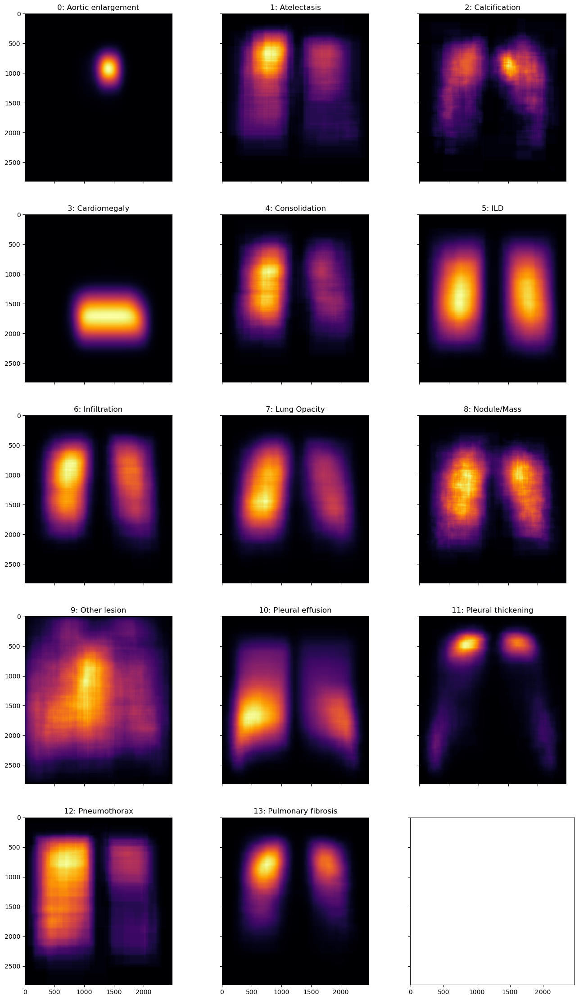

In [26]:
# Plot the mean location
plot_boxes_location(train_df, location)

This figure displays the principal location of each bounding boxes depending on the abnormality. This has not been used during the development of the final method. However it could be interesting to study the position of the boxes for the use of **Data Augmentation** to train models with more precision.

<a id="5"></a>
## 3.2. The Images

In this competition, the images are stored in the DICOM format. So, it is possible to extract some metadatas from the files as well as the images. Let's take the example of an image with some abnormalities identified: 

In [27]:
train_df[train_df.image_id == "0007d316f756b3fa0baea2ff514ce945"]

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,img_original_height,img_original_width,x_min_resized,y_min_resized,x_max_resized,y_max_resized
1446,0007d316f756b3fa0baea2ff514ce945,Pulmonary fibrosis,13,R9,1392.0,702.0,1518.0,790.0,2880,2304,299.0,125.0,321.0,140.0
10982,0007d316f756b3fa0baea2ff514ce945,Pleural thickening,11,R10,818.0,677.0,987.0,939.0,2880,2304,197.0,120.0,227.0,167.0
11723,0007d316f756b3fa0baea2ff514ce945,Cardiomegaly,3,R10,902.0,1827.0,1829.0,2037.0,2880,2304,212.0,325.0,376.0,362.0
22320,0007d316f756b3fa0baea2ff514ce945,Pleural thickening,11,R8,621.0,673.0,1025.0,851.0,2880,2304,162.0,120.0,233.0,151.0
31749,0007d316f756b3fa0baea2ff514ce945,Pulmonary fibrosis,13,R9,804.0,716.0,857.0,920.0,2880,2304,194.0,127.0,204.0,164.0
35148,0007d316f756b3fa0baea2ff514ce945,Aortic enlargement,0,R10,1275.0,1039.0,1498.0,1241.0,2880,2304,278.0,185.0,318.0,221.0
40449,0007d316f756b3fa0baea2ff514ce945,ILD,5,R9,1847.0,1409.0,2093.0,2096.0,2880,2304,380.0,250.0,423.0,373.0
45213,0007d316f756b3fa0baea2ff514ce945,ILD,5,R9,535.0,1748.0,932.0,2013.0,2880,2304,146.0,311.0,217.0,358.0
50083,0007d316f756b3fa0baea2ff514ce945,Aortic enlargement,0,R9,1235.0,1021.0,1482.0,1281.0,2880,2304,271.0,182.0,315.0,228.0
53575,0007d316f756b3fa0baea2ff514ce945,Pleural thickening,11,R9,790.0,634.0,1047.0,725.0,2880,2304,192.0,113.0,237.0,129.0


### 3.2.1 Image and Boxes Plot

In [28]:
"""
Draw the boxes on the given image

Input: The Image, bounding boxe location, color of the box
Output: The annotated image
"""

def draw_bboxes(img, tl, br, rgb, label="", label_location="tl", opacity=0.1, line_thickness=0):

    # Draw a rectangle for the position of the boxe
    rect = np.uint8(np.ones((br[1]-tl[1], br[0]-tl[0], 3))*rgb)
    sub_combo = cv2.addWeighted(img[tl[1]:br[1],tl[0]:br[0],:], 1-opacity, rect, opacity, 1.0)    
    img[tl[1]:br[1],tl[0]:br[0],:] = sub_combo

    if line_thickness>0:
        img = cv2.rectangle(img, tuple(tl), tuple(br), rgb, line_thickness)
        
    if label:
        # Draw the label name above the bounding boxes
        FONT = cv2.FONT_HERSHEY_SIMPLEX
        FONT_SCALE = 0.5
        FONT_THICKNESS = 1
        FONT_LINE_TYPE = cv2.LINE_AA
        
        if type(label)==str:
            LABEL = label.upper().replace(" ", "_")
        else:
            LABEL = f"CLASS_{label:02}"
        
        text_width, text_height = cv2.getTextSize(LABEL, FONT, FONT_SCALE, FONT_THICKNESS)[0]
        
        label_origin = {"tl":tl, "br":br, "tr":(br[0],tl[1]), "bl":(tl[0],br[1])}[label_location]
        label_offset = {
            "tl":np.array([0, -10]), "br":np.array([-text_width, text_height+10]), 
            "tr":np.array([-text_width, -10]), "bl":np.array([0, text_height+10])
        }[label_location]
        
        img = cv2.putText(img, LABEL, tuple(label_origin+label_offset), 
                          FONT, FONT_SCALE, rgb, FONT_THICKNESS, FONT_LINE_TYPE)
    
    return img

In [29]:
"""
Plot and Image with Annotations and Bounding Boxes

Input: An Image ID
Output: None, the image will be displayed with annotations
"""

def plot_img_bboxes(img_id):
    
    img = cv2.imread(os.path.join(TRAIN_DIR, img_id + ".jpeg"))
    val = train_df[train_df.image_id==img_id].values
    
    # Get the list of radiologists that annotated this image and create a color palette 
    # The boxes will be colored according to their radiologist
    rad_list = train_df[train_df.image_id == img_id].rad_id.unique()
    pal = {rad_list[0]: (255,0,0), rad_list[1]: (0,255,0), rad_list[2]: (0,0,255)}
    
    # Add the bounding boxes to the image
    for i in range (len(val)): 
        tl = [int(val[i][-4]), int(val[i][-3])]
        br = [int(val[i][-2]), int(val[i][-1])]
        img = draw_bboxes(img, tl, br, rgb=pal[val[i][3]], label=str(val[i][1]), opacity = 0.08, line_thickness = 2)
    
    # Display the image
    plt.figure(figsize=(8,8))
    plt.axis('off')
    plt.imshow(img);

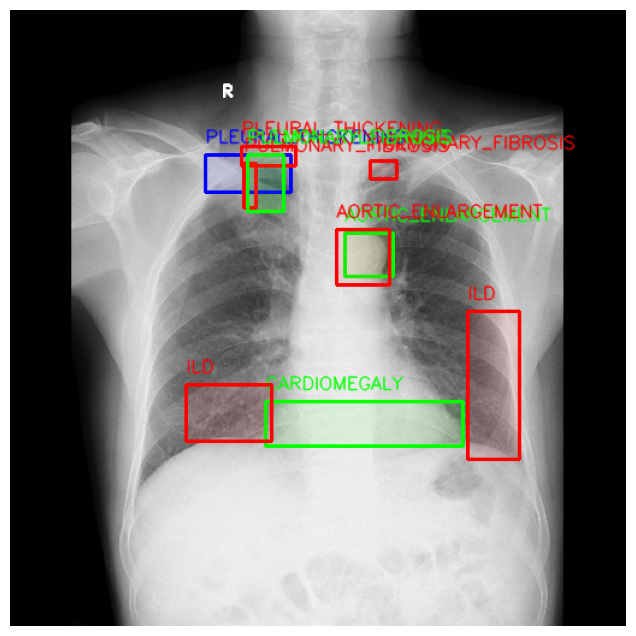

In [30]:
# Plot the image with bounding boxes on it
plot_img_bboxes("0007d316f756b3fa0baea2ff514ce945")

As we can see, the three radiologists (each color represent a specific one) agree on some interesting areas and roughly agree on the observed abnormalities but they are also many areas where only one of the three radiologists find something abnormal. Moreover, there are areas where two radiologists found something but gave two separate labels. So, we are here dealing with label noises and this issue will have to be considered when predicting the label for the test set.

Indeed, as written in [the paper](https://arxiv.org/pdf/2012.15029.pdf), the labels given to the test set have been obtained through a consensus of radiologists. So, we will have to define a threshold in order to accept a predicted label for an image or not.

<a id="3.2.3"></a>
### 3.2.3 Example Images of Each Class

In [31]:
"""
This function will plot Images with bounding boxes of a specific class

Input: Train DataFrame, a list of class id to be plotted, number of images to plot, a height multiplier
Output: None, plot images with bounding boxes
"""

def plot_classes(train_df, class_list, n=4, height_multiplier=2):
    
    # Create a color palette
    pal = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
           [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
           [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]

    
    # Get the row that has the specified class
    df = train_df[train_df.class_id.isin(class_list)]

    plt.figure(figsize=(10, height_multiplier*n))
    for i in range (4):
        image_id = df.image_id.unique()[i]
        val = df[df.image_id==image_id].values
        plt.subplot(n//2,2,i+1)
        
        # Read an image and add the bounding boxes on it
        img = cv2.imread(os.path.join(TRAIN_DIR, image_id+".jpeg"))
        for i in range (len(val)): 
            if val[i][2] != 14:
                tl = [int(val[i][-4]), int(val[i][-3])]
                br = [int(val[i][-2]), int(val[i][-1])]
                img = draw_bboxes(img, tl, br, rgb=pal[val[i][2]], label=str(val[i][1]), opacity = 0.08, line_thickness = 2)
        
        plt.imshow(img)
        plt.axis(False)
        plt.title(f"Image ID – {image_id}", fontdict={'fontsize':10})
   
    plt.tight_layout(rect=[0.05, 0.03, 1, 0.97])
    plt.show();

<u>**AORTIC ENLARGMENT - (0)**</u>

"An abnormal bulge that occurs in the wall of the major blood vessel."

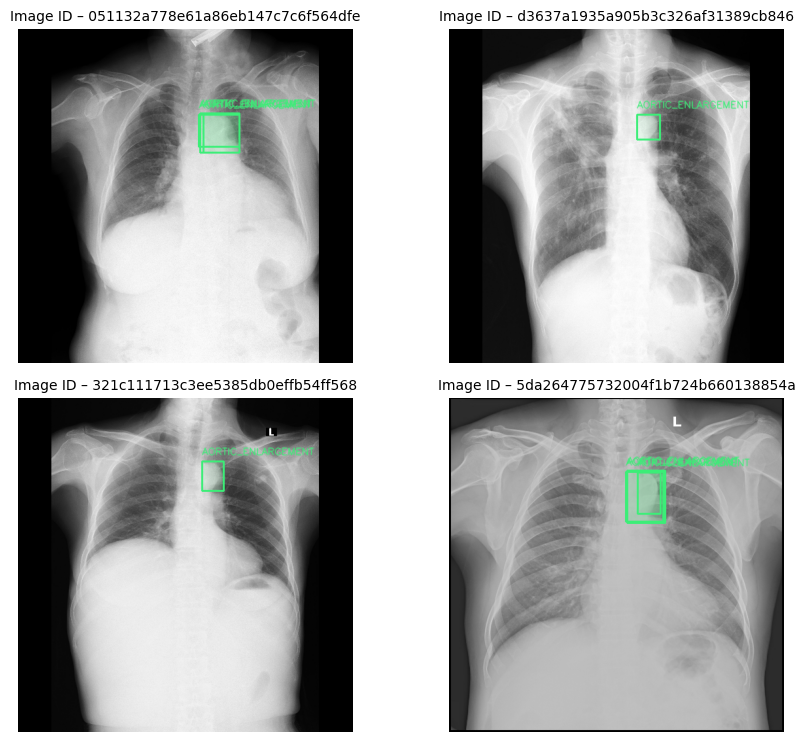

In [32]:
# Display 4 images of with class 0 bounding boxes
plot_classes(train_df, [0]);

<u>**ATELECTASIS - (1)**</u>
    
"Collapse of a part of the lung due to a decrease in the amount of air in the alveoli resulting in volume loss and increased density." 

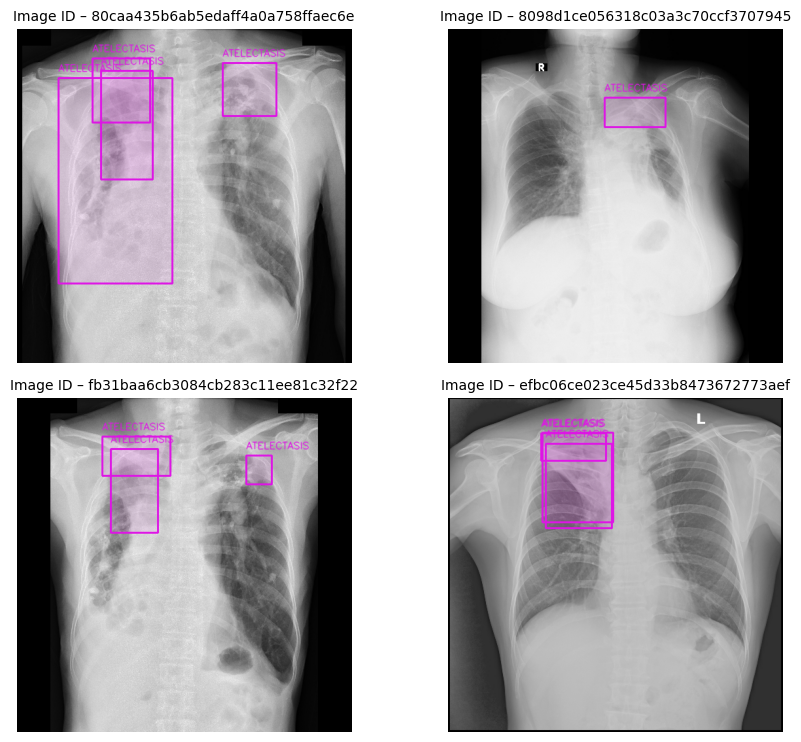

In [33]:
# Display 4 images of with class 1 bounding boxes
plot_classes(train_df, [1]);

<u>**CALCIFICATION - (2)**</u>
    
"Deposition of calcium salts in the lung."

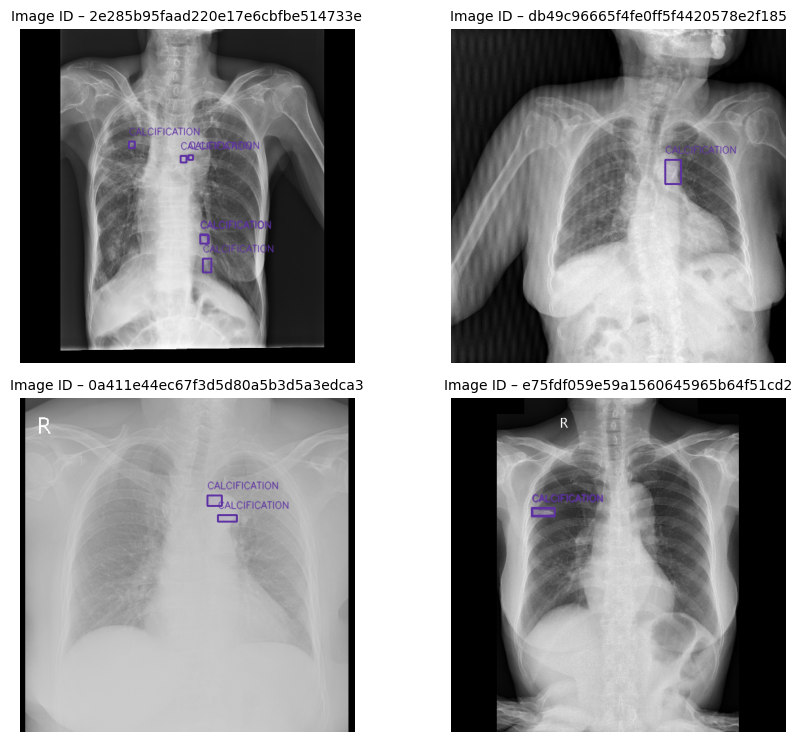

In [34]:
# Display 4 images of with class 2 bounding boxes
plot_classes(train_df, [2]);

<u>**CARDIOMEGALY - (3)**</u>
    
"Enlargement of the heart, occurs when the heart of an adult patient is larger than normal and the cardiothoracic ratio is greater than 0.5."

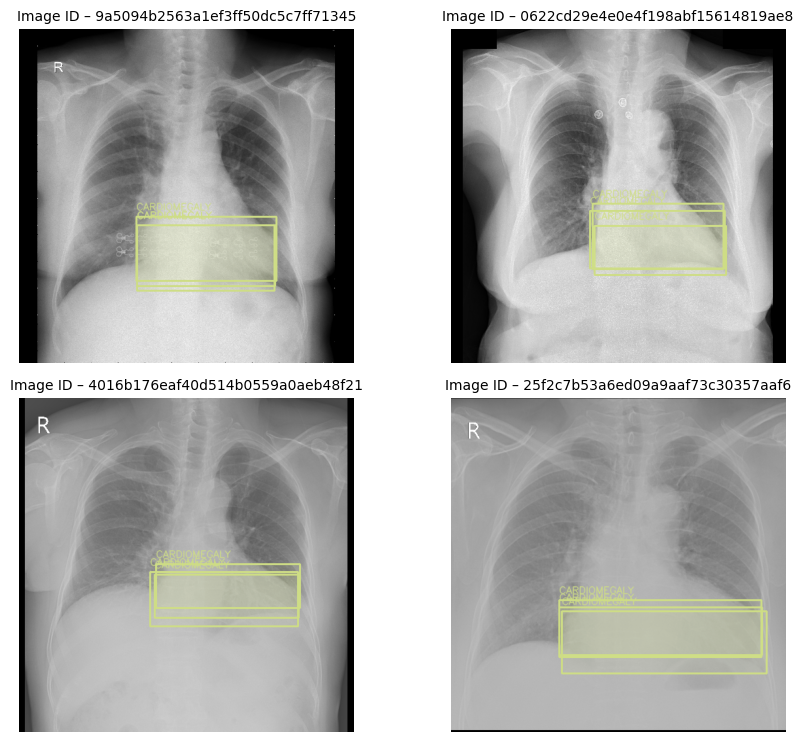

In [35]:
# Display 4 images of with class 3 bounding boxes
plot_classes(train_df, [3]);

<u>**CONSOLIDATION - (4)**</u>
    
"Any pathologic process that fills the alveoli with fluid, pus, blood, cells (including tumor cells) or other substances resulting in lobar, diffuse or multifocal ill-defined opacities."

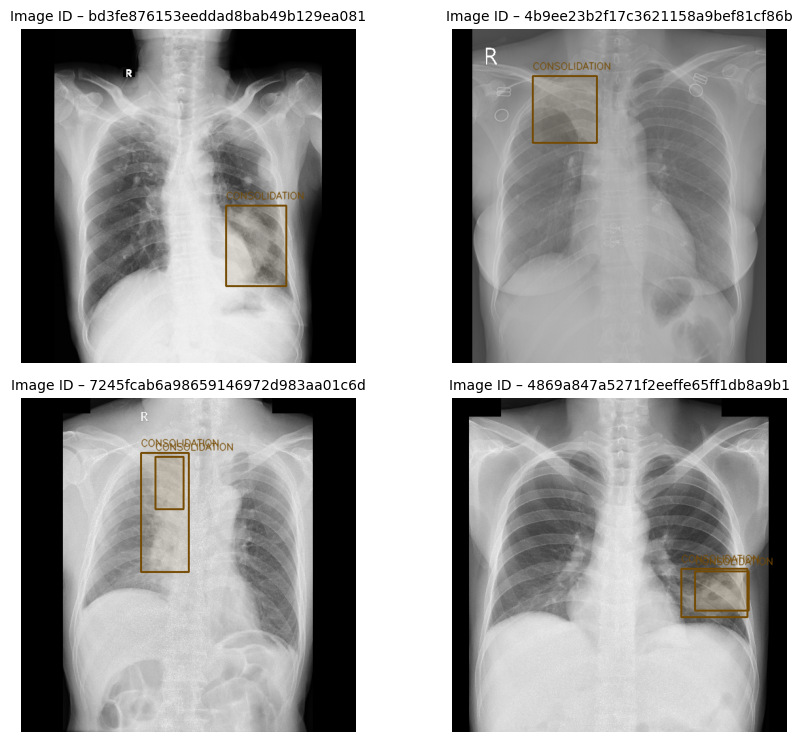

In [36]:
# Display 4 images of with class 4 bounding boxes
plot_classes(train_df, [4]);

<u>**ILD - (5)**</u>
    
"Interstitial lung disease (ILD) Involvement of the supporting tissue of the lung parenchyma resulting in fine or coarse reticular opacities or small nodules."

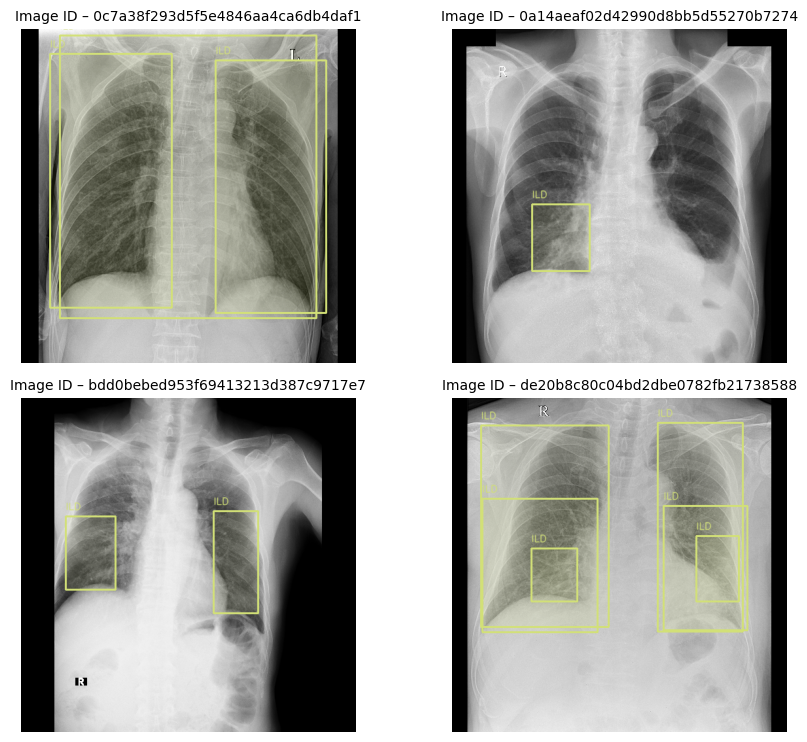

In [37]:
# Display 4 images of with class 5 bounding boxes
plot_classes(train_df, [5]);

<u>**INFILTRATION - (6)**</u>
    
"An abnormal substance that accumulates gradually within cells or body tissues or any substance or type of cell that occurs within or spreads as through the interstices (interstitium and/or alveoli) of the lung, that is foreign to the lung, or that accumulates in greater than normal quantity within it."

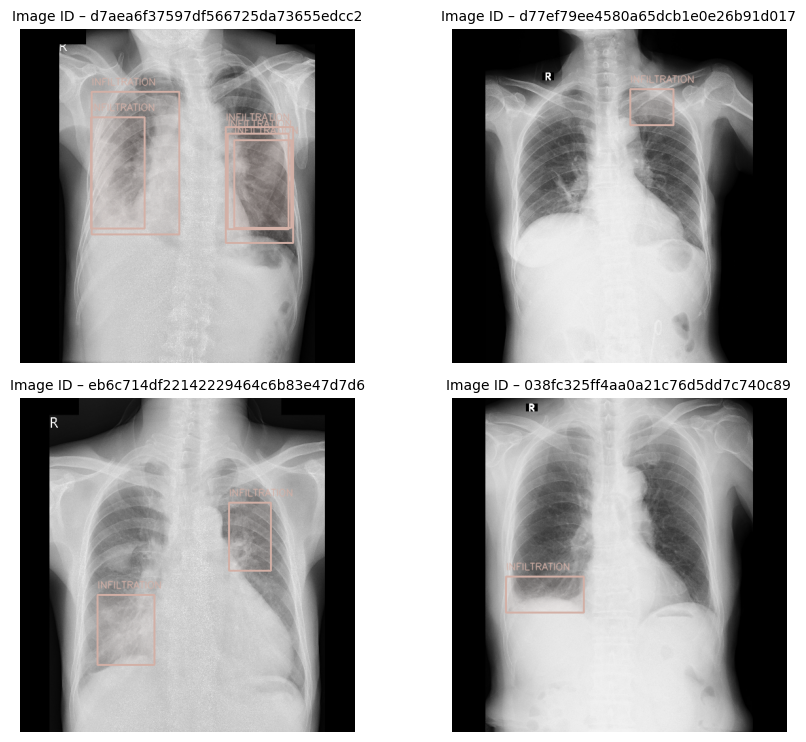

In [38]:
# Display 4 images of with class 6 bounding boxes
plot_classes(train_df, [6]);

<u>**LUNG OPACITY - (7)**</u>
    
"Any abnormal focal or generalized opacity or opacities in lung fields (blanket tag including but not limited to consolidation, cavity, fibrosis, nodule, mass, calcification, interstitial thickening, etc.)."

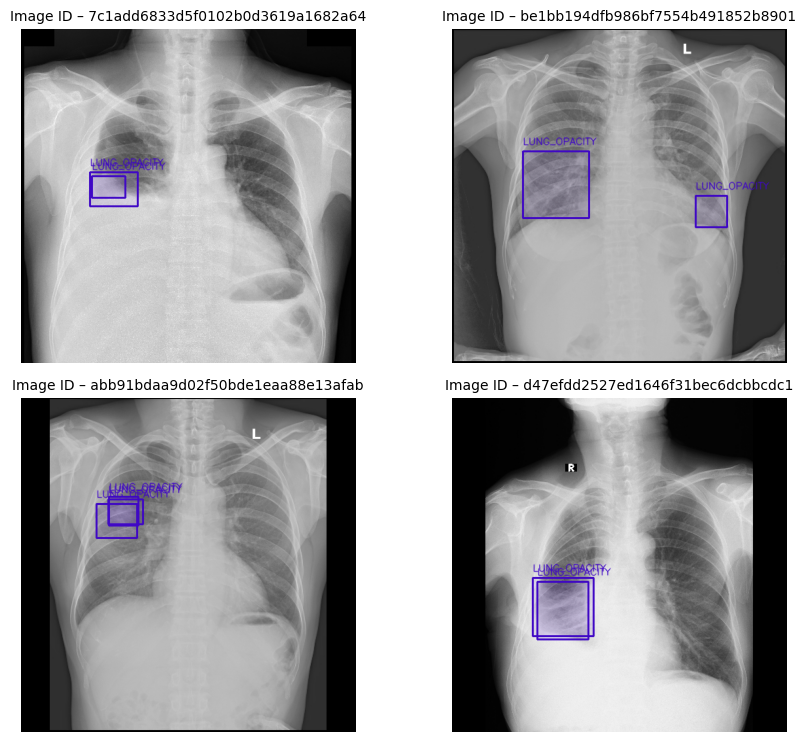

In [39]:
# Display 4 images of with class 7 bounding boxes
plot_classes(train_df, [7]);

<u>**NODULE/MASS - (8)**</u>
    
"Any space occupying lesion either solitary or multiple."

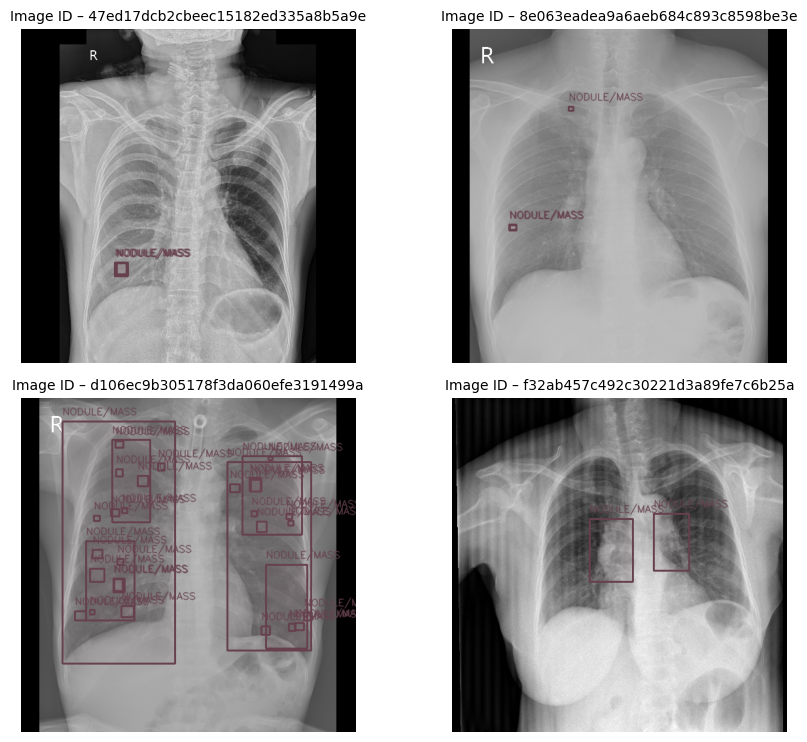

In [40]:
# Display 4 images of with class 8 bounding boxes
plot_classes(train_df, [8]);

<u>**OTHER LESION - (9)**</u>
    
"Other lesions that are not on the list of findings or abnormalities mentioned above."

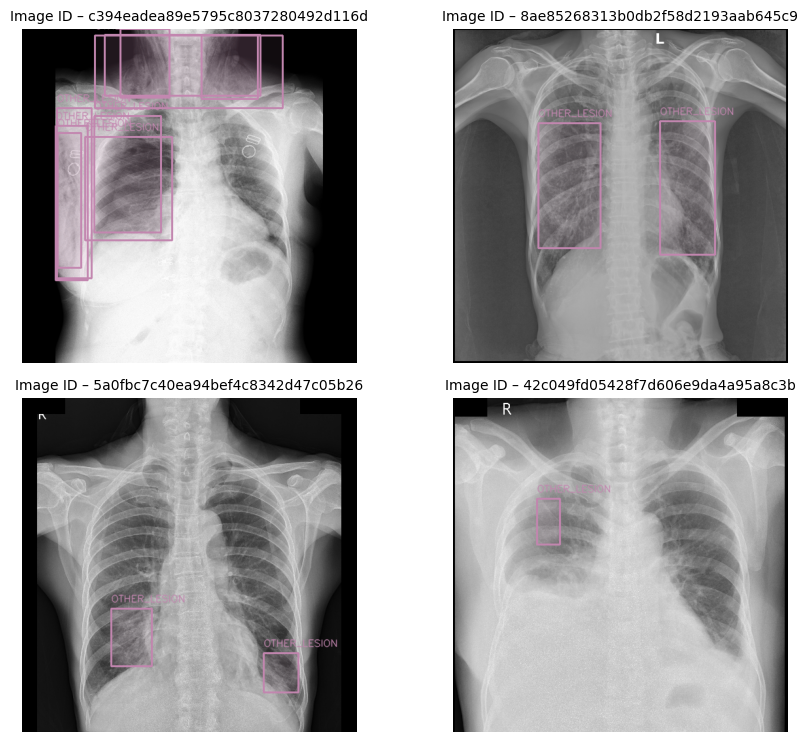

In [41]:
# Display 4 images of with class 9 bounding boxes
plot_classes(train_df, [9]);

<u>**PLEURAL EFFUSION - (10)**</u>
    
"Abnormal accumulations of fluid within the pleural space."

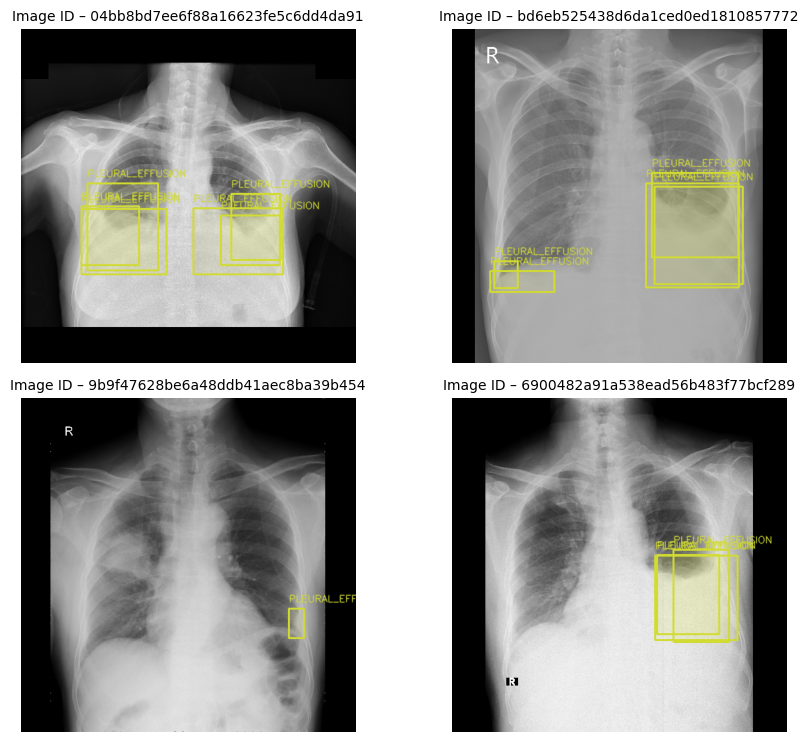

In [42]:
# Display 4 images of with class 10 bounding boxes
plot_classes(train_df, [10]);

<u>**PLEURAL THICKENING - (11)**</u>
    
"Any form of thickening involving either the parietal or visceral pleura."

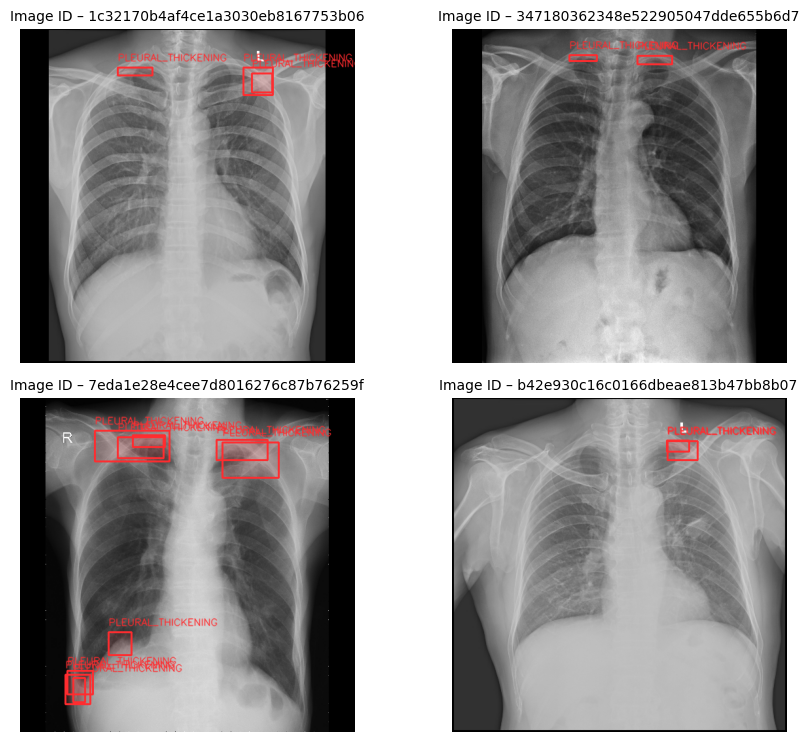

In [43]:
# Display 4 images of with class 11 bounding boxes
plot_classes(train_df, [11]);

<u>**PNEUMOTHORAX - (12)**</u>
    
"The presence of gas (air) in the pleural space." 

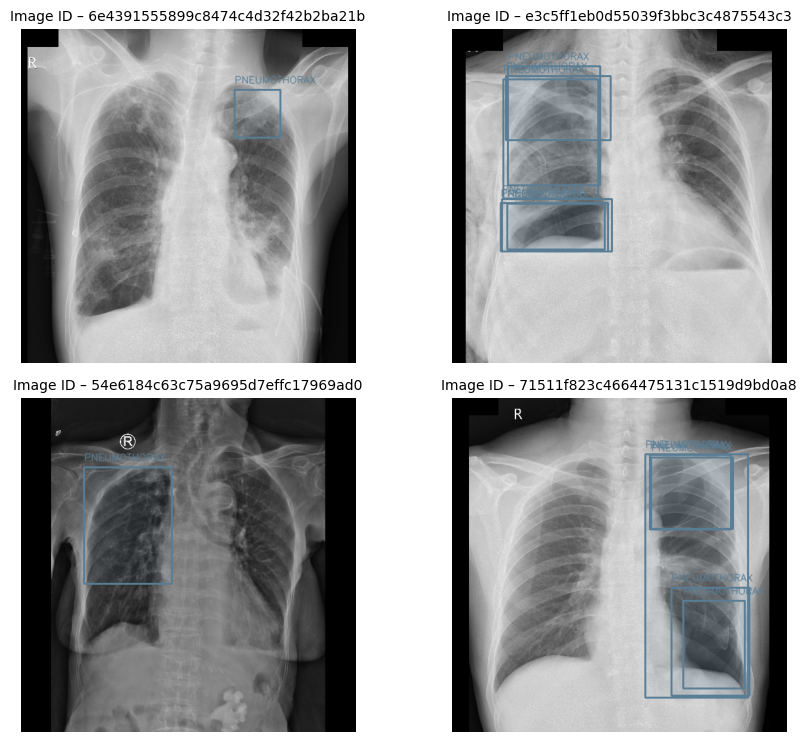

In [44]:
# Display 4 images of with class 12 bounding boxes
plot_classes(train_df, [12]);

<u>**PULMONARY FIBROSIS - (13)**</u>
    
"An excess of fibrotic tissue in the lung."

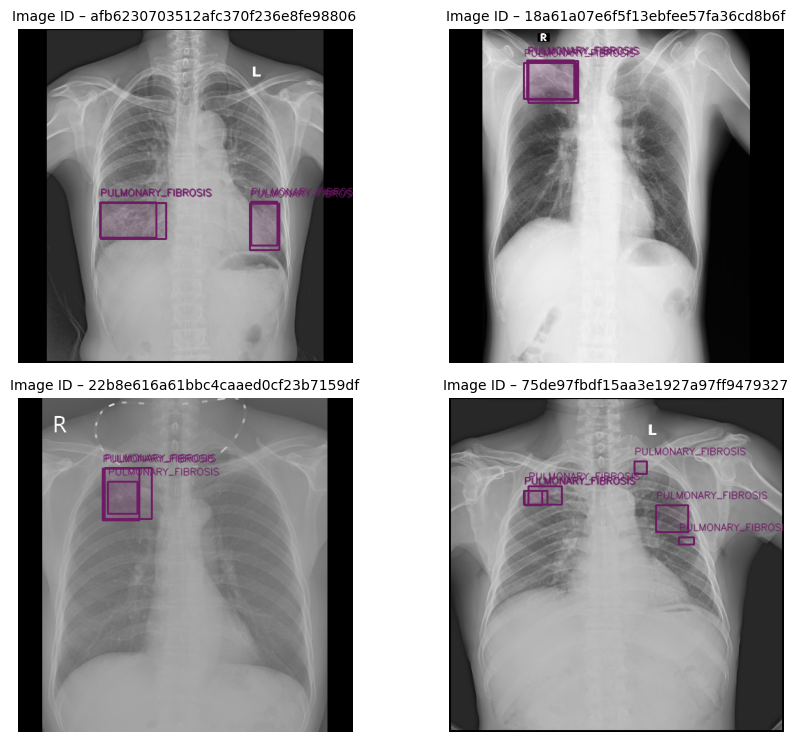

In [45]:
# Display 4 images of with class 13 bounding boxes
plot_classes(train_df, [13]);

<u>**NO FINDING - (14)**</u>
    
"The absence of all pathologies from the chest radiograph."

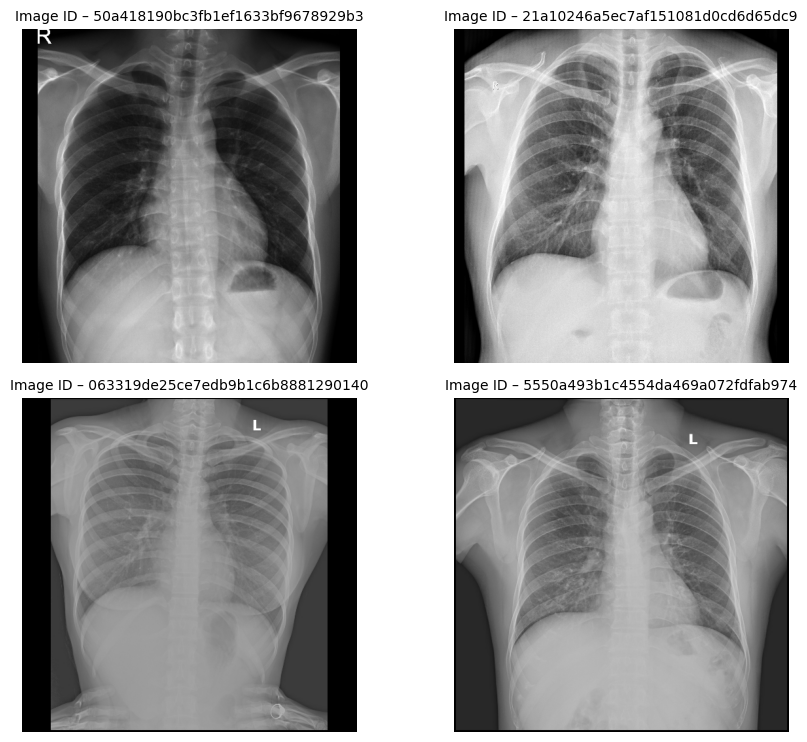

In [46]:
# Display 4 images of with class 14 bounding boxes
plot_classes(train_df, [14]);

### 3.2.3 Bounding Boxes Fusion

As part of the data preprocesing that will be done for the training of the majority of the models, the fusion of the bounding boxes has to be considered as it can greatly reduce the number of boxes and determine new bounding boxes that coul be seen as the result of a consensus between the annotations of all radiologists. This method is therefore relevant as it simulate a consensus between radiologists as it has been done for the labelling process of the test images.

In [47]:
"""
This function creates a list of images annotated with their original bounding boxes and with
the bounding boxes resulting of the WBF algorithm

Input: A list of Image ID, Train DataFrame
Output: A List of images with original bounding boxes and fused bounding boxes
"""

def plot_WBF(image_ids, train_df):
    
    # Define color for each labels
    label2color = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
                 [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
                 [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]

    images_vis = []
    
    # Loop over the list of images given
    for idx, image_id in enumerate(image_ids):
        # Get the image path and open it
        img_path = os.path.join(TRAIN_DIR, image_id + '.jpeg')
        img = cv2.imread(img_path)
        
        # Retrieve the list of annotations to plot
        img_annotations = train_df[train_df.image_id == image_id].values
        
        labels = []
        scores = []
        boxes = []

        img_before = img.copy()
        
        # Add the original annotations to a copy of the image
        for i in range (len(img_annotations)): 
            # Save the original annotations
            labels.append(img_annotations[i][2])
            scores.append(1.0)
            boxes.append([int(img_annotations[i][-4])/512, int(img_annotations[i][-3])/512, int(img_annotations[i][-2])/512, int(img_annotations[i][-1])/512])
            
            tl = [int(img_annotations[i][-4]), int(img_annotations[i][-3])]
            br = [int(img_annotations[i][-2]), int(img_annotations[i][-1])]
            img_before = draw_bboxes(img_before, tl, br, rgb=label2color[img_annotations[i][2]], label=str(img_annotations[i][1]), opacity = 0.08, line_thickness = 2)
           
        # Add the annotated image with its original bounding boxes in the list
        images_vis.append(img_before)

        # Apply the WBF algorithm to the bounding boxes
        boxes, scores, labels = weighted_boxes_fusion([boxes], [scores], [labels], weights=None,iou_thr=0.4, skip_box_thr=0.0001)

        # Create a copy of the image and add the fused bounding boxes to it
        img_after = img.copy()
        for i in range (len(labels)): 
            tl = [int(boxes[i][-4]*512), int(boxes[i][-3]*512)]
            br = [int(boxes[i][-2]*512), int(boxes[i][-1]*512)]
            img_after = draw_bboxes(img_after, tl, br, rgb=label2color[int(labels[i])], label=int_2_str[int(labels[i])], opacity = 0.08, line_thickness = 2)
        
        # Add the new annotated image to the list of images
        images_vis.append(img_after)
        
    return images_vis

In [48]:
"""
This function will compred the bounding boxes before and after applying the WBF algorithm

Input: A list of annotated images with their original boxes and fused boxes
Output: None, the images will be displayed
"""

def plot_imgs(imgs):
    
    # Create a Figure
    fig = plt.figure(figsize=(20, 30))
    
    # Add subplots with the different images
    for i, img in enumerate(imgs):
        plt.subplot(3, 2, i+1)
        plt.axis('off')
        plt.imshow(img, cmap='gray')
        
    plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
    plt.figtext(0.73, 0.9,"WBF", va="top", ha="center", size=25)
    plt.show();

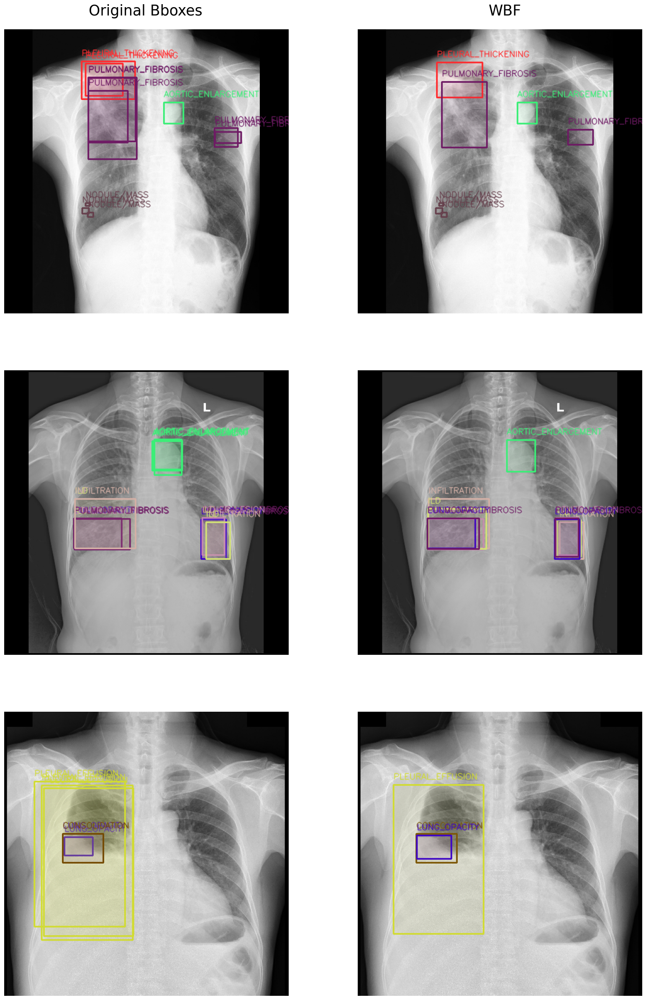

In [49]:
# List of images with interesting annotations
image_ids = ['d3637a1935a905b3c326af31389cb846', 'afb6230703512afc370f236e8fe98806', '7c1add6833d5f0102b0d3619a1682a64']

# Get the annotated image list
imgs_vis = plot_WBF(image_ids, train_df)

# Plot the images
plot_imgs(imgs_vis)

The comparison of the bounding boxes before and after applying the WBF method shows that this method can reduce the number of boxes that has the same label when they are located in the same region. The algorithm is able to determine a new boxe given the initial ones and their confidence score. This method will be used as a preprocessing method for the training of Yolo models.